# **IMI BIG DATA & AI CASE COMPETITION**

## *By: Hafsa, Cindy, Tahir & Albert*

In order to move to the modelling phase, we must pre-process our data, make sure we have no data-leakage and fix the class imbalance problem. 

# Initial Set-Up & Import Data <a class="anchor" id="1"></a>

In [65]:
# Import relevent Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import gc
import math

# Model Metrics & Data Pre-processing 
from scipy import stats
from sklearn import metrics
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, log_loss
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, classification_report, precision_recall_curve
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV, RandomizedSearchCV

#Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier

#import lightgbm and xgboost 
import lightgbm as lgb 
import xgboost as xgb 

# Imbalance dataset methods
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import ADASYN
from imblearn.combine import SMOTETomek
from imblearn.combine import SMOTEENN

# Miscellaneous
from collections import Counter

# Remove warnings (so it doesn't take up space)
import warnings
warnings.filterwarnings('ignore')

# Set seed for repition 
np.random.seed(2022)

In [66]:
# Some settings for making the tables, plots and the report look nicer
sns.set_theme()
%matplotlib inline
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 999)

## Read in the data & the features selected from Feature Selection

In [67]:
# Read in the data
# Canadian Companies Data
df1 = pd.read_excel("/Users/tahir/Desktop/Fraudit/Datasets/Feature_Engineering_Completed_df1.xlsx")

# General Companies Data
df2 = pd.read_excel("/Users/tahir/Desktop/Fraudit/Datasets/Feature_Engineering_Completed_df2.xlsx")

# Get the top 100 features from feature selection
best_features = pd.read_excel("/Users/tahir/Desktop/Github/Fraudit/Data/Top 100 Features.xlsx")

# Data Dictionary from Canadian Companies Dataset (Although both data dictionaries are the same) 
data_dictionary = pd.read_excel("/Users/tahir/Desktop/Fraudit/Datasets/cmeg_df_case_competition_scrambled_train.xlsx", sheet_name=1)

In [68]:
# Remove the index column which gets added when you export to excel 
df1.drop(["Unnamed: 0"], axis=1, inplace=True)
df2.drop(["Unnamed: 0"], axis=1, inplace=True)
best_features.drop(["Unnamed: 0"], axis=1, inplace=True)

In [69]:
best_features = best_features.rename(columns={0: "features"})
df1 = df1.drop(labels=best_features["features"], axis=1)
# Rename the columns so same as df1 
df2 = df2.rename(columns = {'INVENTORY_3YearAverage':'Inventory_3YearAverage', 
                            'INVENTORY_Y0':'Inventory_Y0',
                            'INVENTORY_Y1':'Inventory_Y1', 
                            'INVENTORY_Y2':'Inventory_Y2'})
df2 = df2.drop(labels=best_features["features"], axis=1)

In [70]:
# Starting off with 200 columns, now theres 98 columns left
df1.shape

(28224, 98)

In [71]:
df2.shape

(28464, 98)

## Baseline Model Metrics Before & After Feature Selection

In [8]:
## Accuracy before Feature Selection

Training Data size: (22579, 194)
Total Number of class labels in Test Set:
 1    4890
0     755
Name: B_PLUS_FLAG, dtype: int64
Training Model :  Logistic Regression
Done Training Logistic Regression
Training Model :  Decision Tree
Done Training Decision Tree


,Model Name,Train Accuracy,Test Accuracy,TP,TN,FN,FP,F1-Score,AUC,G-Mean,Log-Loss
0,Logistic Regression,86.084415,86.625332,4890,0,0,755,0.928334,0.933127,0.000000,4.619554
1,Decision Tree,87.191638,86.448184,4850,30,40,725,0.926899,0.934431,0.185924,4.680734


## Metrics after Feature Selection

We can note that the G-mean increased in both of the models

In [72]:
def run_base_models(data, cols_to_drop):
    
    # Initialize empty lists for results. 
    model_name, train_acc, test_acc, logLoss = [], [], [], []
    TN_lst, FN_lst, TP_lst, FP_lst, F1_SCORE, AUC, G_Mean = [], [], [], [], [], [], []
    
    # Get rid of the row column, and the Final IG label. 
    all_features = data.drop(axis=1, labels =cols_to_drop)
    all_targets = all_features.pop("B_PLUS_FLAG")
    train_features, test_features, train_targets, test_targets = train_test_split(all_features, all_targets, test_size=0.2, stratify=all_targets, random_state=2022)
    
    # Initialize all models in a list
    models = [LogisticRegression(),
              DecisionTreeClassifier(max_depth=8),
             ]
    # Define all the model names
    model_names = ["Logistic Regression",
                   "Decision Tree",
                  ]
    # Print the data size
    print("Training Data size: {}".format(train_features.shape))
    print("Total Number of class labels in Test Set:\n", test_targets.value_counts())

    # Loop over models instead of having separate cell per model
    for name, model in zip(model_names, models):
        # Training and model accuracy
        model.random_state = 0
        print("Training Model :  {}".format(name))
        model.fit(train_features, train_targets)
        print("Done Training {}".format(name))
        test_score = model.score(test_features, test_targets) * 100
        train_score = model.score(train_features, train_targets) * 100

        # Predict Y values and see the TP, FP, et c(Using confusion matrix)
        y_pred = model.predict(test_features) # removed the predict.probabilities
        precision, recall, thresholds = metrics.precision_recall_curve(test_targets, y_pred)
        pr_auc = metrics.auc(recall, precision)
        f1score = f1_score(test_targets, y_pred)
        CM = confusion_matrix(test_targets, y_pred)
        TN, FN, TP, FP = CM[0][0], CM[1][0],  CM[1][1], CM[0][1]
        Sensitivity, Specifity = (TP / (TP + FP)) , (TN / (FP + TN))
        Gmean = np.sqrt(Sensitivity * Specifity)
        logloss = log_loss(test_targets, y_pred)
        
        # Store results
        model_name.append(name)
        train_acc.append(train_score)
        test_acc.append(test_score)
        TN_lst.append(TN)
        FN_lst.append(FN)
        TP_lst.append(TP)
        FP_lst.append(FP)
        F1_SCORE.append(f1score)
        AUC.append(pr_auc)
        G_Mean.append(Gmean)
        logLoss.append(logloss) 
        
    results_dict = {"Model Name": model_name, "Train Accuracy": train_acc, "Test Accuracy": test_acc, "TP": TP_lst, "TN": TN_lst, "FN": FN_lst, "FP": FP_lst, "F1-Score": F1_SCORE, "AUC":AUC, "G-Mean": G_Mean, "Log-Loss": logLoss}
    results_df = pd.DataFrame.from_dict(results_dict)
    
    return results_df

drop_cols = ["ROW", "Final_IG", "Date"]
run_base_models(df1, drop_cols)

Training Data size: (22579, 94)
Total Number of class labels in Test Set:
 1    4866
0     779
Name: B_PLUS_FLAG, dtype: int64
Training Model :  Logistic Regression
Done Training Logistic Regression
Training Model :  Decision Tree
Done Training Decision Tree


,Model Name,Train Accuracy,Test Accuracy,TP,TN,FN,FP,F1-Score,AUC,G-Mean,Log-Loss
0,Logistic Regression,86.243855,86.235607,4863,5,3,774,0.926021,0.931304,0.074412,4.754163
1,Decision Tree,87.337792,85.810452,4813,31,53,748,0.923180,0.931994,0.185585,4.901002


## Data Standardization (Standardization, Normalization and Robust Transformation)

In [73]:
def Standardize(xtrain, xtest, method):
    """ The following function takes in the given dataset, and standardizes it based on the given method."""
    
    if method == "Gaussian":
        std_scaler = StandardScaler()
        std_scaler.fit_transform(xtrain)
        std_scaler.transform(xtest)
        return xtrain, xtest

    if method == "Normalize":
        norm_scaler = MinMaxScaler()
        norm_scaler.fit_transform(xtrain)
        norm_scaler.transform(xtest)
        return xtrain, xtest
        
    if method == "Robust":
        robust_scaler = RobustScaler()
        robust_scaler.fit_transform(xtrain)
        robust_scaler.transform(xtest)
        return xtrain, xtest
        
    return xtrain, xtest 

### Select best standardization method

In [74]:
def run_base_models_standardized(data, cols_to_drop, std_technique):
    
    #Initialize empty lists for results
    all_features, all_targets, train_targets, test_targets, X_train, X_test = 0, 0, 0, 0, 0, 0
    model_name, train_acc, test_acc, logLoss = [], [], [], []
    TN_lst, FN_lst, TP_lst, FP_lst, F1_SCORE, AUC, G_Mean = [], [], [], [], [], [], []

    # Get rid of the row column, and the Final IG label. 
    all_features = data.drop(axis=1, labels =cols_to_drop)
    all_targets = all_features.pop("B_PLUS_FLAG")
    X_train, X_test, train_targets, test_targets = train_test_split(all_features, all_targets, test_size=0.20, stratify=all_targets, random_state=2022)
    train_features, test_features = Standardize(X_train, X_test, std_technique)
    
    # Initialize all models in a list
    models = [LogisticRegression(),
              DecisionTreeClassifier(max_depth=8),
             ]
    # Define all the model names
    model_names = ["Logistic Regression",
                   "Decision Tree",
                  ]
    # Print the data size
    print("Training Data size: {}".format(train_features.shape))
    print("Total Number of class labels in Test Set:\n", test_targets.value_counts())

    # Loop over models instead of having separate cell per model
    for name, model in zip(model_names, models):
        # Training and model accuracy
        model.random_state = 0
        print("Training Model :  {}".format(name))
        model.fit(train_features, train_targets)
        print("Done Training {}".format(name))
        test_score = model.score(test_features, test_targets) * 100
        train_score = model.score(train_features, train_targets) * 100

        # Predict Y values and see the TP, FP, et c(Using confusion matrix)
        y_pred = model.predict(test_features) # removed the predict.probabilities
        precision, recall, thresholds = metrics.precision_recall_curve(test_targets, y_pred)
        pr_auc = metrics.auc(recall, precision)
        f1score = f1_score(test_targets, y_pred)
        CM = confusion_matrix(test_targets, y_pred)
        TN, FN, TP, FP = CM[0][0], CM[1][0],  CM[1][1], CM[0][1]
        Sensitivity, Specifity = (TP / (TP + FP)) , (TN / (FP + TN))
        Gmean = np.sqrt(Sensitivity * Specifity)
        logloss = log_loss(test_targets, y_pred)
        
        # Store results
        model_name.append(name)
        train_acc.append(train_score)
        test_acc.append(test_score)
        TN_lst.append(TN)
        FN_lst.append(FN)
        TP_lst.append(TP)
        FP_lst.append(FP)
        F1_SCORE.append(f1score)
        AUC.append(pr_auc)
        G_Mean.append(Gmean)
        logLoss.append(logloss)
        
    results_dict = {"Model Name": model_name, "Train Accuracy": train_acc, "Test Accuracy": test_acc, "TP": TP_lst, "TN": TN_lst, "FN": FN_lst, "FP": FP_lst, "F1-Score": F1_SCORE, "AUC":AUC, "G-Mean": G_Mean, "Log-Loss": logLoss}
    results_df = pd.DataFrame.from_dict(results_dict)
        
    return results_df

### Gaussian Standardization

In [75]:
#Initialize empty lists for results
run_base_models_standardized(df1, drop_cols, "Gaussian")

Training Data size: (22579, 94)
Total Number of class labels in Test Set:
 1    4866
0     779
Name: B_PLUS_FLAG, dtype: int64
Training Model :  Logistic Regression
Done Training Logistic Regression
Training Model :  Decision Tree
Done Training Decision Tree


,Model Name,Train Accuracy,Test Accuracy,TP,TN,FN,FP,F1-Score,AUC,G-Mean,Log-Loss
0,Logistic Regression,86.243855,86.235607,4863,5,3,774,0.926021,0.931304,0.074412,4.754163
1,Decision Tree,87.337792,85.810452,4813,31,53,748,0.923180,0.931994,0.185585,4.901002


### Normalization Standardization

In [80]:
run_base_models_standardized(df1, drop_cols, "Normalize")

Training Data size: (22579, 94)
Total Number of class labels in Test Set:
 1    4866
0     779
Name: B_PLUS_FLAG, dtype: int64
Training Model :  Logistic Regression
Done Training Logistic Regression
Training Model :  Decision Tree
Done Training Decision Tree


,Model Name,Train Accuracy,Test Accuracy,TP,TN,FN,FP,F1-Score,AUC,G-Mean,Log-Loss
0,Logistic Regression,86.243855,86.235607,4863,5,3,774,0.926021,0.931304,0.074412,4.754163
1,Decision Tree,87.337792,85.810452,4813,31,53,748,0.923180,0.931994,0.185585,4.901002


### Robust Standardization

In [82]:
run_base_models_standardized(df1, drop_cols, "Robust")

Training Data size: (22579, 94)
Total Number of class labels in Test Set:
 1    4866
0     779
Name: B_PLUS_FLAG, dtype: int64
Training Model :  Logistic Regression
Done Training Logistic Regression
Training Model :  Decision Tree
Done Training Decision Tree


,Model Name,Train Accuracy,Test Accuracy,TP,TN,FN,FP,F1-Score,AUC,G-Mean,Log-Loss
0,Logistic Regression,86.243855,86.235607,4863,5,3,774,0.926021,0.931304,0.074412,4.754163
1,Decision Tree,87.337792,85.810452,4813,31,53,748,0.923180,0.931994,0.185585,4.901002


### Gaussian Percentile Method

This method uses just the middle 99.8% of the data to standardize columns <br>
It's less prone to outliers

In [84]:
# get the non-financial columns
non_financial_features = ['ROW','Date','Corp_Residence_Country_Code', 'BR Code', 'CUSTOMER_ID', 'Final_IG', 'B_PLUS_FLAG']
financial_features = df1.drop(non_financial_features, axis=1)
financial_features.head()

,EBITDA_Y0,TOTALASSET_Y0,TOTALASSET_Y2,TOTALASSET_Y3,TOTALDEBT_Y0,TOTALDEBT_Y1,TOTALDEBT_Y3,TOTALREVENUE_Y0,TOTALREVENUE_Y1,TOTALREVENUE_Y2,TOTALREVENUE_Y3,CURRENTASSET_Y2,FIXEDASSET_Y0,FIXEDASSET_Y3,CURRENTLIABILITY_Y3,NONCURRLIA_Y2,TOTALEQUITY_Y0,TOTALEQUITY_Y3,TOTALNETWORTH_Y2,TOTALNETWORTH_Y3,TOTINTEXP_Y1,LEASERENTEXP_Y1,LEASERENTEXP_Y2,LEASERENTEXP_Y3,EBITDAR_Y3,receivabledays_Y2,INVENTORYDAYS_Y0,INVENTORYDAYS_Y3,payableDAYS_Y0,payableDAYS_Y1,payableDAYS_Y3,tangibleNetWorth_Y0,tangibleNetWorth_Y1,tangibleNetWorth_Y2,FIXEDCHARGECOV_Y0,DEBTSERVCOV_Y0,NETPROFIT_Y0,NETPROFIT_Y1,NETPROFIT_Y3,NETSALES_Y2,ASSETTURNOVER_Y2,ASSETTURNOVER_Y3,OPERPROFIT_Y0,OPERPROFIT_Y2,OPERPROFIT_Y3,ARTurnover_Y2,Inventory_Y3,RETAINED_EARNINGS_Y0,RETAINED_EARNINGS_Y1,RETAINED_EARNINGS_Y2,RETAINED_EARNINGS_Y3,FCF_Y0,FCF_Y2,CCE_Y2,CCE_Y3,Year,missing_data_flag,EBITDA_3YearAverage,TOTALASSET_3YearAverage,TOTALDEBT_3YearAverage,TOTALREVENUE_3YearAverage,CURRENTASSET_3YearAverage,FIXEDASSET_3YearAverage,CURRENTLIABILITY_3YearAverage,TOTALEQUITY_3YearAverage,TOTALNETWORTH_3YearAverage,CAPITALIZATION_3YearAverage,EBITDAR_3YearAverage,INVENTORYDAYS_3YearAverage,Capex2Dep_3YearAverage,tangibleNetWorth_3YearAverage,NETPROFIT_3YearAverage,RETAINED_EARNINGS_3YearAverage,FCF_3YearAverage,Total_Leverage_Y0,Total_Leverage_Y1,Total_Leverage_Y3,Ebitda_Margin_Y1,Ebitda_Margin_Y2,Ebitda_Margin_Y3,Interest_CR_Y3,Growth_Y2_to_Y1,Current_Ratio_Y3,Quick_Ratio_Y1,Quick_Ratio_Y3,Debt_Ratio_Y2,Return_Net_Sales_Y2,Average_Total_Assets,Asset_Turnover_Y1,Asset_Turnover_Y2,Asset_Turnover_Y3
0,575863.911214,619611.510181,611355.907673,582433.004400,623105.791017,596800.177680,598408.339905,611355.411490,589592.109008,605336.777910,574789.603998,614991.732391,609095.636450,580405.105567,583030.371565,600103.052065,596259.219747,601814.939331,596653.190112,590035.602606,604922.163814,576650.299516,620686.247107,610847.649882,618110.180319,590842.797526,590472.808115,574363.146314,582917.058057,583420.366083,583658.695782,590316.935078,602489.197881,607756.994574,579949.325730,573565.511062,623675.986993,618944.803911,590502.807033,595156.410271,608524.711934,622059.106399,575870.723892,570519.450943,608807.689045,621562.468837,588954.395020,604537.606945,597031.247138,600893.706501,590802.111805,606861.990009,587502.761835,603242.309649,622846.821734,2017,1,586584.943568,618271.670268,609304.862614,602763.503201,619553.452999,601863.209979,576880.644499,583218.942030,579945.197593,593531.196346,592446.376722,595352.641112,599825.044022,598249.924789,612469.435351,601225.731355,590447.163586,1.082037,0.989983,0.973650,1.022467,0.964168,1.056249,1.002464,-0.026010,1.036787,2.028418,2.078371,0.982178,0.980661,615305.200681,0.974311,0.967254,0.954216
1,599469.364624,608126.531748,587550.520995,508218.086643,627335.355343,611300.879046,0.000000,604626.757034,586282.226249,624691.726730,501716.330148,620321.870767,577715.935070,505654.999259,511127.253255,617623.837767,599915.942888,0.000000,582300.999226,484085.796269,601973.826113,571906.704700,577600.492683,511973.808386,511385.032364,571806.694543,623527.400755,0.000000,625385.094320,627447.879790,0.000000,584262.286957,617559.499371,627464.217041,622519.607329,585261.894944,584319.594719,582119.776636,512159.166941,577905.225922,625997.193308,511309.169231,599331.009039,579472.873802,512615.646688,581883.305291,0.000000,603346.339606,621227.589036,594596.565749,0.000000,519458.368851,0.000000,589034.257388,0.000000,2015,2,607711.848590,601323.625703,609814.288424,602970.795594,606140.877563,578330.764924,608768.294754,594814.472686,589344.521979,590552.129934,598740.974758,617741.404544,594804.718168,604961.786669,588079.089621,607362.361892,245446.846183,1.046484,0.993383,0.000000,1.049619,0.980812,1.000000,1.000000,-0.061486,0.755764,2.051120,0.000000,0.974456,1.060217,456606.158088,1.197810,1.145666,0.836537
2,613829.072017,608391.483917,607825.470188,592953.319963,585464.960100,571781.269380,593575.189122,608591.366569,578175.2

In [85]:
data1 = df1.copy()
data2 = df2.copy()

### Gaussian Percentiles Method 

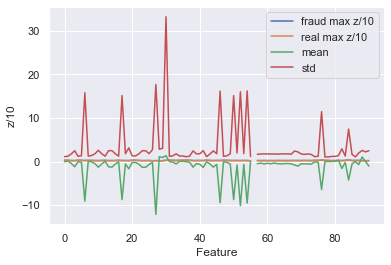

In [86]:
data = financial_features
data_cols = list(financial_features.columns)

# Center and scale all data, only using the middle 99%, so outliers don't pull too much.
# First generate the percentile data for each feature
percentiles =  pd.DataFrame( np.array([ np.percentile( data[i], [ 0.1, 99.9 ] ) for i in data_cols ]).T,
                            columns=data_cols, index=['min','max'] )

percentile_means = \
    [ [ np.mean( data.loc[ (data[i]>percentiles[i]['min']) & (data[i]<percentiles[i]['max']) , i ] ) ]
     for i in data_cols ]

percentiles = percentiles.append( pd.DataFrame(np.array(percentile_means).T, columns=data_cols, index=['mean']) )

percentile_stds = \
    [ [ np.std( data.loc[ (data[i]>percentiles[i]['min']) & (data[i]<percentiles[i]['max']) , i ] ) ]
     for i in data_cols ]

percentiles = percentiles.append( pd.DataFrame(np.array(percentile_stds).T, columns=data_cols, index=['stdev']) )

percentiles

# STANDARDIZE THE FINANCIAL FEATUES.
data1[data_cols] = ( data1[data_cols] - percentiles.loc[ 'mean', data_cols ] ) / percentiles.loc[ 'stdev', data_cols ]


# There are outliers, 2000-8000 stdevs away from mean in several columns
plot_cols = data_cols
plt.plot( data1.loc[ data1.B_PLUS_FLAG==1, plot_cols ].abs().max().values / data1[ plot_cols ].std().values / 10, label='fraud max z/10' )
plt.plot( data1.loc[ data1.B_PLUS_FLAG==0, plot_cols ].abs().max().values / data1[ plot_cols ].std().values / 10, label='real max z/10' )
plt.plot( data1[ plot_cols ].mean().values, label='mean' )
plt.plot( data1[ plot_cols ].std().values, label='std' )
plt.xlabel('Feature')
plt.ylabel('z/10')
plt.legend() ; 

As we can see below, we don't have any more outliers

In [91]:
data1.describe()

,ROW,Corp_Residence_Country_Code,BR Code,CUSTOMER_ID,Final_IG,B_PLUS_FLAG,EBITDA_Y0,TOTALASSET_Y0,TOTALASSET_Y2,TOTALASSET_Y3,TOTALDEBT_Y0,TOTALDEBT_Y1,TOTALDEBT_Y3,TOTALREVENUE_Y0,TOTALREVENUE_Y1,TOTALREVENUE_Y2,TOTALREVENUE_Y3,CURRENTASSET_Y2,FIXEDASSET_Y0,FIXEDASSET_Y3,CURRENTLIABILITY_Y3,NONCURRLIA_Y2,TOTALEQUITY_Y0,TOTALEQUITY_Y3,TOTALNETWORTH_Y2,TOTALNETWORTH_Y3,TOTINTEXP_Y1,LEASERENTEXP_Y1,LEASERENTEXP_Y2,LEASERENTEXP_Y3,EBITDAR_Y3,receivabledays_Y2,INVENTORYDAYS_Y0,INVENTORYDAYS_Y3,payableDAYS_Y0,payableDAYS_Y1,payableDAYS_Y3,tangibleNetWorth_Y0,tangibleNetWorth_Y1,tangibleNetWorth_Y2,FIXEDCHARGECOV_Y0,DEBTSERVCOV_Y0,NETPROFIT_Y0,NETPROFIT_Y1,NETPROFIT_Y3,NETSALES_Y2,ASSETTURNOVER_Y2,ASSETTURNOVER_Y3,OPERPROFIT_Y0,OPERPROFIT_Y2,OPERPROFIT_Y3,ARTurnover_Y2,Inventory_Y3,RETAINED_EARNINGS_Y0,RETAINED_EARNINGS_Y1,RETAINED_EARNINGS_Y2,RETAINED_EARNINGS_Y3,FCF_Y0,FCF_Y2,CCE_Y2,CCE_Y3,Year,missing_data_flag,EBITDA_3YearAverage,TOTALASSET_3YearAverage,TOTALDEBT_3YearAverage,TOTALREVENUE_3YearAverage,CURRENTASSET_3YearAverage,FIXEDASSET_3YearAverage,CURRENTLIABILITY_3YearAverage,TOTALEQUITY_3YearAverage,TOTALNETWORTH_3YearAverage,CAPITALIZATION_3YearAverage,EBITDAR_3YearAverage,INVENTORYDAYS_3YearAverage,Capex2Dep_3YearAverage,tangibleNetWorth_3YearAverage,NETPROFIT_3YearAverage,RETAINED_EARNINGS_3YearAverage,FCF_3YearAverage,Total_Leverage_Y0,Total_Leverage_Y1,Total_Leverage_Y3,Ebitda_Margin_Y1,Ebitda_Margin_Y2,Ebitda_Margin_Y3,Interest_CR_Y3,Growth_Y2_to_Y1,Current_Ratio_Y3,Quick_Ratio_Y1,Quick_Ratio_Y3,Debt_Ratio_Y2,Return_Net_Sales_Y2,Average_Total_Assets,Asset_Turnover_Y1,Asset_Turnover_Y2,Asset_Turnover_Y3
count,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,22284.0,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000
mean,20150.780860,0.327664,15.226368,6247.749894,6.698838,0.861926,-0.036562,0.092643,-0.439063,-1.194377,-0.041523,-0.161178,-9.104235,0.041881,-0.062844,-0.491445,-1.302349,-0.551495,0.085792,-1.201313,-1.293852,-0.586927,-0.038834,-8.741182,-0.551924,-1.675896,-0.212611,-0.197186,-0.625049,-1.336050,-1.302948,-0.660475,-0.203731,-12.143650,1.080477,0.928058,1.343577,-0.019760,-0.127925,-0.551284,0.027068,0.030772,-0.046432,-0.151434,-1.287017,-0.470735,-0.630676,-1.348371,-0.043331,-0.570890,-1.284763,-0.640397,-9.455517,-0.052777,-0.161014,-0.584172,-8.742115,-0.787144,-10.136802,-0.671484,-9.529497,0.037082,NaN,-0.512410,-0.352825,-0.537275,-0.406704,-0.496185,-0.353935,-0.489761,-0.521458,-0.487637,-0.443225,-0.521706,-0.792581,-1.051626,-0.503365,-0.530406,-0.551449,-0.581514,-0.065826,-0.167126,-6.423587,0.005527,0.001698,0.005161,0.047358,0.309676,-1.599536,-0.218116,-4.265540,-0.570490,-0.000321,-0.697116,1.047253,0.021993,-1.063107
std,11623.416657,0.470953,15.996785,4114.837993,2.025439,0.344984,1.121649,1.217569,1.755964,2.474568,1.201247,1.353524,15.789065,1.258606,1.3

<AxesSubplot:>

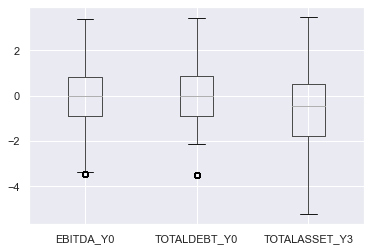

In [92]:
data1.boxplot(column=['EBITDA_Y0', 'TOTALDEBT_Y0', 'TOTALASSET_Y3'])  

In [95]:
data1

,ROW,Corp_Residence_Country_Code,BR Code,CUSTOMER_ID,Final_IG,B_PLUS_FLAG,EBITDA_Y0,TOTALASSET_Y0,TOTALASSET_Y2,TOTALASSET_Y3,TOTALDEBT_Y0,TOTALDEBT_Y1,TOTALDEBT_Y3,TOTALREVENUE_Y0,TOTALREVENUE_Y1,TOTALREVENUE_Y2,TOTALREVENUE_Y3,CURRENTASSET_Y2,FIXEDASSET_Y0,FIXEDASSET_Y3,CURRENTLIABILITY_Y3,NONCURRLIA_Y2,TOTALEQUITY_Y0,TOTALEQUITY_Y3,TOTALNETWORTH_Y2,TOTALNETWORTH_Y3,TOTINTEXP_Y1,LEASERENTEXP_Y1,LEASERENTEXP_Y2,LEASERENTEXP_Y3,EBITDAR_Y3,receivabledays_Y2,INVENTORYDAYS_Y0,INVENTORYDAYS_Y3,payableDAYS_Y0,payableDAYS_Y1,payableDAYS_Y3,tangibleNetWorth_Y0,tangibleNetWorth_Y1,tangibleNetWorth_Y2,FIXEDCHARGECOV_Y0,DEBTSERVCOV_Y0,NETPROFIT_Y0,NETPROFIT_Y1,NETPROFIT_Y3,NETSALES_Y2,ASSETTURNOVER_Y2,ASSETTURNOVER_Y3,OPERPROFIT_Y0,OPERPROFIT_Y2,OPERPROFIT_Y3,ARTurnover_Y2,Inventory_Y3,RETAINED_EARNINGS_Y0,RETAINED_EARNINGS_Y1,RETAINED_EARNINGS_Y2,RETAINED_EARNINGS_Y3,FCF_Y0,FCF_Y2,CCE_Y2,CCE_Y3,Date,Year,missing_data_flag,EBITDA_3YearAverage,TOTALASSET_3YearAverage,TOTALDEBT_3YearAverage,TOTALREVENUE_3YearAverage,CURRENTASSET_3YearAverage,FIXEDASSET_3YearAverage,CURRENTLIABILITY_3YearAverage,TOTALEQUITY_3YearAverage,TOTALNETWORTH_3YearAverage,CAPITALIZATION_3YearAverage,EBITDAR_3YearAverage,INVENTORYDAYS_3YearAverage,Capex2Dep_3YearAverage,tangibleNetWorth_3YearAverage,NETPROFIT_3YearAverage,RETAINED_EARNINGS_3YearAverage,FCF_3YearAverage,Total_Leverage_Y0,Total_Leverage_Y1,Total_Leverage_Y3,Ebitda_Margin_Y1,Ebitda_Margin_Y2,Ebitda_Margin_Y3,Interest_CR_Y3,Growth_Y2_to_Y1,Current_Ratio_Y3,Quick_Ratio_Y1,Quick_Ratio_Y3,Debt_Ratio_Y2,Return_Net_Sales_Y2,Average_Total_Assets,Asset_Turnover_Y1,Asset_Turnover_Y2,Asset_Turnover_Y3
0,5662,1,5,1576,5,1,-1.367203,0.721058,0.350369,-1.201728,1.238986,-0.218377,-0.111578,0.194857,-0.849655,-0.058250,-1.655976,0.749410,0.185094,-1.275857,-1.074258,-0.009613,-0.285803,0.042027,-0.279065,-0.669882,0.363693,-1.296134,1.338353,0.781160,1.107778,-0.459085,-0.467469,-1.483202,-0.908498,-0.870129,-0.935744,-0.596565,0.055694,0.355701,-1.019946,-1.381977,1.385313,1.130931,-0.526039,-0.583232,0.603910,1.457757,-1.319942,-1.699999,0.589290,1.418314,-0.669995,0.196855,-0.198820,-0.000705,-0.583622,0.421480,-0.700006,0.260447,1.505592,2017-10-01,-0.057465,-inf,-1.248839,1.121609,0.833541,-0.257687,1.562334,-0.192917,-2.177232,-1.585321,-1.909046,-0.810460,-0.689153,0.248936,0.135910,-0.266491,1.285508,0.038263,0.314389,1.906931,-0.305400,-0.738892,0.807966,-0.685561,2.297224,0.047443,-0.725036,0.907438,0.503341,0.816631,-0.225607,-0.231506,0.632500,-1.013993,-1.250716,-1.641110
1,16369,1,5,4545,7,1,-0.029028,0.139305,-0.913224,-5.230155,1.473177,0.595943,-36.292357,-0.129722,-1.013283,0.932159,-5.482641,1.053045,-1.386398,-5.229634,-5.414849,1.013827,-0.090620,-34.765955,-1.085826,-6.843089,0.192241,-1.574013,-1.273503,-5.366134,-5.382067,-1.617187,1.435465,-36.165852,1.555842,1.702466,-37.998108,-0.916440,0.870276,1.445206,1.364864,-0.724301,-0.833716,-0.975343,-5.320765,-1.462727,1.664061,-5.413902,0.006820,-1.168896,-5.307492,-0.993224,-36.992960,0.133539,1.105841,-0.351693,-34.838169,-4.539143,-35.358954,-0.592024,-37.025991,2015-10-01,-1.378508,NaN,0.748755,-0.243055,0.881021,-0.242501,0.382779,-2.038682,0.713416,-0.566669,-1.077017,-1.063092,-0.101570,0.670915,-0.359139,0.319516,-1.055255,0.581980,-3.578719,1.052934,-0.223087,-25.882784,1.444359,-0.236988,0.312384,-0.041280,-1.655932,-6.454523,0.812075,-17.006287,-0.412708,1.943794,-2.513792,5.358759,4.057252,-5.193358
2,2326,0,12,648,8,1,0.785012,0.152726,0.162973,-0.630680,-0.845192,-1.623372,-0.403798,0.061524,-1.414064,-0.202190,-0.047652,-0.548605,-1.354979,-0.470612,-0.256860,0.120264,-1.274548,0.062656,-0.300675,-0.491040,-1.000694,0.286849,0.420750,-0.295870,-0.089993,0.244608,-0.851774,-0.925469,1.448846,-0.454357,-0.077264,-0.462402,1.323551,-0.084633,0.080120,-1.435893,1.654117,1.596377,-0.520598,-0.406211,-0.501443,0.491776,0.828140,0.277955,-0.583509,0.589535,0.502711,0.949767,1.006230,0.188562,0.100617,-0.728067,-0.481750,0.225383,0.393285

In [114]:
# Initialize empty lists for results
all_features, all_targets, train_targets, test_targets, X_train, X_test = 0, 0, 0, 0, 0, 0
model_name, train_acc, test_acc, logLoss = [], [], [], []
TN_lst, FN_lst, TP_lst, FP_lst, F1_SCORE, AUC, G_Mean = [], [], [], [], [], [], []
# Get rid of the row column, and the Final IG label. 
all_features = data1.drop(axis=1, labels =["ROW", "Final_IG", "Date"])
all_targets = all_features.pop("B_PLUS_FLAG")

all_features.replace([np.inf, -np.inf], np.nan, inplace=True)
all_features.fillna(0, inplace=True)


In [115]:
train_features, test_features, train_targets, test_targets = train_test_split(all_features, all_targets, test_size=0.20, stratify=all_targets, random_state=2022)

# Initialize all models in a list
models = [LogisticRegression(),
          DecisionTreeClassifier(max_depth=8),
         ]
# Define all the model names
model_names = ["Logistic Regression",
               "Decision Tree",
              ]
# Print the data size
print("Training Data size: {}".format(train_features.shape))
print("Total Number of class labels in Test Set:\n", test_targets.value_counts())

# Loop over models instead of having separate cell per model
for name, model in zip(model_names, models):
    # Training and model accuracy
    model.random_state = 0
    print("Training Model :  {}".format(name))
    model.fit(train_features, train_targets)
    print("Done Training {}".format(name))
    test_score = model.score(test_features, test_targets) * 100
    train_score = model.score(train_features, train_targets) * 100

    # Predict Y values and see the TP, FP, et c(Using confusion matrix)
    y_pred = model.predict(test_features) # removed the predict.probabilities
    precision, recall, thresholds = metrics.precision_recall_curve(test_targets, y_pred)
    pr_auc = metrics.auc(recall, precision)
    f1score = f1_score(test_targets, y_pred)
    CM = confusion_matrix(test_targets, y_pred)
    TN, FN, TP, FP = CM[0][0], CM[1][0],  CM[1][1], CM[0][1]
    Sensitivity, Specifity = (TP / (TP + FP)) , (TN / (FP + TN))
    Gmean = np.sqrt(Sensitivity * Specifity)
    logloss = log_loss(test_targets, y_pred)

    # Store results
    model_name.append(name)
    train_acc.append(train_score)
    test_acc.append(test_score)
    TN_lst.append(TN)
    FN_lst.append(FN)
    TP_lst.append(TP)
    FP_lst.append(FP)
    F1_SCORE.append(f1score)
    AUC.append(pr_auc)
    G_Mean.append(Gmean)
    logLoss.append(logloss)

results_dict = {"Model Name": model_name, "Train Accuracy": train_acc, "Test Accuracy": test_acc, "TP": TP_lst, "TN": TN_lst, "FN": FN_lst, "FP": FP_lst, "F1-Score": F1_SCORE, "AUC":AUC, "G-Mean": G_Mean, "Log-Loss": logLoss}
results_df = pd.DataFrame.from_dict(results_dict)
results_df

Training Data size: (17827, 95)
Total Number of class labels in Test Set:
 1    3839
0     618
Name: B_PLUS_FLAG, dtype: int64
Training Model :  Logistic Regression
Done Training Logistic Regression
Training Model :  Decision Tree
Done Training Decision Tree


,Model Name,Train Accuracy,Test Accuracy,TP,TN,FN,FP,F1-Score,AUC,G-Mean,Log-Loss
0,Logistic Regression,86.060470,86.089298,3836,1,3,617,0.925229,0.930667,0.037335,4.804697
1,Decision Tree,87.244068,85.909805,3811,18,28,600,0.923879,0.931483,0.158633,4.866689


## Min-Max Normalization Method

In [116]:
data1 = df1.copy()
data2 = df2.copy()

for col in data1.columns:
  if col in financial_features:
    data1[col]=(data1[col]-data1[col].min())/(data1[col].max()-data1[col].min())
  else:
    pass

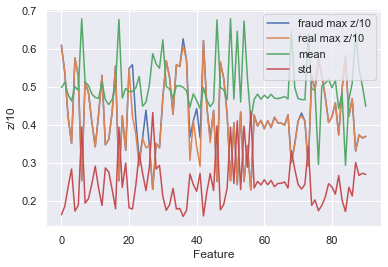

In [117]:
plot_cols = data_cols
plt.plot( data1.loc[ data1.B_PLUS_FLAG==1, plot_cols ].abs().max().values / data1[ plot_cols ].std().values / 10, label='fraud max z/10' )
plt.plot( data1.loc[ data1.B_PLUS_FLAG==0, plot_cols ].abs().max().values / data1[ plot_cols ].std().values / 10, label='real max z/10' )
plt.plot( data1[ plot_cols ].mean().values, label='mean' )
plt.plot( data1[ plot_cols ].std().values, label='std' )
plt.xlabel('Feature')
plt.ylabel('z/10')
plt.legend() ; 

In [120]:
# Initialize empty lists for results
all_features, all_targets, train_targets, test_targets, X_train, X_test = 0, 0, 0, 0, 0, 0
model_name, train_acc, test_acc, logLoss = [], [], [], []
TN_lst, FN_lst, TP_lst, FP_lst, F1_SCORE, AUC, G_Mean = [], [], [], [], [], [], []
# Get rid of the row column, and the Final IG label. 
all_features = data1.drop(axis=1, labels =["ROW", "Final_IG", "Date"])
all_targets = all_features.pop("B_PLUS_FLAG")
train_features, test_features, train_targets, test_targets = train_test_split(all_features, all_targets, test_size=0.20, stratify=all_targets, random_state=2022)

# Initialize all models in a list
models = [LogisticRegression(),
          DecisionTreeClassifier(max_depth=8),
         ]
# Define all the model names
model_names = ["Logistic Regression",
               "Decision Tree",
              ]
# Print the data size
print("Training Data size: {}".format(train_features.shape))
print("Total Number of class labels in Test Set:\n", test_targets.value_counts())

# Loop over models instead of having separate cell per model
for name, model in zip(model_names, models):
    # Training and model accuracy
    model.random_state = 0
    print("Training Model :  {}".format(name))
    model.fit(train_features, train_targets)
    print("Done Training {}".format(name))
    test_score = model.score(test_features, test_targets) * 100
    train_score = model.score(train_features, train_targets) * 100

    # Predict Y values and see the TP, FP, et c(Using confusion matrix)
    y_pred = model.predict(test_features) # removed the predict.probabilities
    precision, recall, thresholds = metrics.precision_recall_curve(test_targets, y_pred)
    pr_auc = metrics.auc(recall, precision)
    f1score = f1_score(test_targets, y_pred)
    CM = confusion_matrix(test_targets, y_pred)
    TN, FN, TP, FP = CM[0][0], CM[1][0],  CM[1][1], CM[0][1]
    Sensitivity, Specifity = (TP / (TP + FP)) , (TN / (FP + TN))
    Gmean = np.sqrt(Sensitivity * Specifity)
    logloss = log_loss(test_targets, y_pred)

    # Store results
    model_name.append(name)
    train_acc.append(train_score)
    test_acc.append(test_score)
    TN_lst.append(TN)
    FN_lst.append(FN)
    TP_lst.append(TP)
    FP_lst.append(FP)
    F1_SCORE.append(f1score)
    AUC.append(pr_auc)
    G_Mean.append(Gmean)
    logLoss.append(logloss)

results_dict = {"Model Name": model_name, "Train Accuracy": train_acc, "Test Accuracy": test_acc, "TP": TP_lst, "TN": TN_lst, "FN": FN_lst, "FP": FP_lst, "F1-Score": F1_SCORE, "AUC":AUC, "G-Mean": G_Mean, "Log-Loss": logLoss}
results_df = pd.DataFrame.from_dict(results_dict)
results_df

Training Data size: (22579, 94)
Total Number of class labels in Test Set:
 1    4866
0     779
Name: B_PLUS_FLAG, dtype: int64
Training Model :  Logistic Regression
Done Training Logistic Regression
Training Model :  Decision Tree
Done Training Decision Tree


,Model Name,Train Accuracy,Test Accuracy,TP,TN,FN,FP,F1-Score,AUC,G-Mean,Log-Loss
0,Logistic Regression,86.190708,86.200177,4866,0,0,779,0.925887,0.931001,0.000000,4.766400
1,Decision Tree,87.337792,85.810452,4813,31,53,748,0.923180,0.931994,0.185585,4.901002


## Robust Scaler Method 

In [121]:
data1 = df1.copy()
data2 = df2.copy()
#RobustScaler is less prone to outliers.
#std_scaler = StandardScaler()
rob_scaler = RobustScaler()

# STANDARDIZE THE FINANCIAL FEATUES (Robust)
data = financial_features
data_cols = list(financial_features.columns)
for col in data1:
    if col not in financial_features:
        pass
    else:
        data1[col]= rob_scaler.fit_transform(data1[col].values.reshape(-1,1))

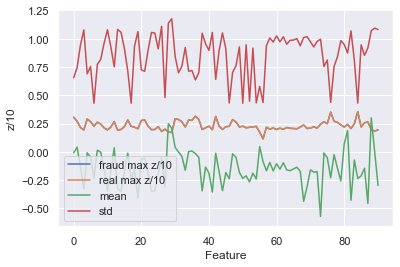

In [122]:
# There outliers very very far from the mean.
plot_cols = data_cols
plt.plot( data1.loc[ data1.B_PLUS_FLAG==1, plot_cols ].abs().max().values / data1[ plot_cols ].std().values / 10, label='fraud max z/10' )
plt.plot( data1.loc[ data1.B_PLUS_FLAG==0, plot_cols ].abs().max().values / data1[ plot_cols ].std().values / 10, label='real max z/10' )
plt.plot( data1[ plot_cols ].mean().values, label='mean' )
plt.plot( data1[ plot_cols ].std().values, label='std' )
plt.xlabel('Feature')
plt.ylabel('z/10')
plt.legend() ; 

In [123]:
data1.describe()

,ROW,Corp_Residence_Country_Code,BR Code,CUSTOMER_ID,Final_IG,B_PLUS_FLAG,EBITDA_Y0,TOTALASSET_Y0,TOTALASSET_Y2,TOTALASSET_Y3,TOTALDEBT_Y0,TOTALDEBT_Y1,TOTALDEBT_Y3,TOTALREVENUE_Y0,TOTALREVENUE_Y1,TOTALREVENUE_Y2,TOTALREVENUE_Y3,CURRENTASSET_Y2,FIXEDASSET_Y0,FIXEDASSET_Y3,CURRENTLIABILITY_Y3,NONCURRLIA_Y2,TOTALEQUITY_Y0,TOTALEQUITY_Y3,TOTALNETWORTH_Y2,TOTALNETWORTH_Y3,TOTINTEXP_Y1,LEASERENTEXP_Y1,LEASERENTEXP_Y2,LEASERENTEXP_Y3,EBITDAR_Y3,receivabledays_Y2,INVENTORYDAYS_Y0,INVENTORYDAYS_Y3,payableDAYS_Y0,payableDAYS_Y1,payableDAYS_Y3,tangibleNetWorth_Y0,tangibleNetWorth_Y1,tangibleNetWorth_Y2,FIXEDCHARGECOV_Y0,DEBTSERVCOV_Y0,NETPROFIT_Y0,NETPROFIT_Y1,NETPROFIT_Y3,NETSALES_Y2,ASSETTURNOVER_Y2,ASSETTURNOVER_Y3,OPERPROFIT_Y0,OPERPROFIT_Y2,OPERPROFIT_Y3,ARTurnover_Y2,Inventory_Y3,RETAINED_EARNINGS_Y0,RETAINED_EARNINGS_Y1,RETAINED_EARNINGS_Y2,RETAINED_EARNINGS_Y3,FCF_Y0,FCF_Y2,CCE_Y2,CCE_Y3,Year,missing_data_flag,EBITDA_3YearAverage,TOTALASSET_3YearAverage,TOTALDEBT_3YearAverage,TOTALREVENUE_3YearAverage,CURRENTASSET_3YearAverage,FIXEDASSET_3YearAverage,CURRENTLIABILITY_3YearAverage,TOTALEQUITY_3YearAverage,TOTALNETWORTH_3YearAverage,CAPITALIZATION_3YearAverage,EBITDAR_3YearAverage,INVENTORYDAYS_3YearAverage,Capex2Dep_3YearAverage,tangibleNetWorth_3YearAverage,NETPROFIT_3YearAverage,RETAINED_EARNINGS_3YearAverage,FCF_3YearAverage,Total_Leverage_Y0,Total_Leverage_Y1,Total_Leverage_Y3,Ebitda_Margin_Y1,Ebitda_Margin_Y2,Ebitda_Margin_Y3,Interest_CR_Y3,Growth_Y2_to_Y1,Current_Ratio_Y3,Quick_Ratio_Y1,Quick_Ratio_Y3,Debt_Ratio_Y2,Return_Net_Sales_Y2,Average_Total_Assets,Asset_Turnover_Y1,Asset_Turnover_Y2,Asset_Turnover_Y3
count,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,2.822400e+04,28224.000000,28224.000000,28224.000000,2.822400e+04,28224.000000,2.822400e+04,28224.000000,2.822400e+04,2.822400e+04,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,2.822400e+04,28224.000000,2.822400e+04,28224.000000,28224.000000,2.822400e+04,28224.000000,28224.000000,2.822400e+04,28224.000000,28224.000000,28224.000000,28224.000000,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,28224.000000,2.822400e+04,28224.000000,28224.000000,28224.000000,2.822400e+04,28224.000000,28224.000000,28224.000000,28224.000000,2.822400e+04,28224.000000,28224.000000,28224.000000,2.822400e+04,28224.000000,28224.000000,2.822400e+04,2.822400e+04,28224.000000,28224.000000,28224.000000,2.822400e+04,28224.000000,28224.000000,28224.000000,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,28224.000000,28224.000000,2.822400e+04,28224.000000,28224.000000,2.822400e+04,2.822400e+04,2.822400e+04,28224.000000,2.822400e+04,2.822400e+04,2.822400e+04,28224.000000,2.822400e+04,28224.000000,28224.000000,28224.000000,28224.000000,2.822400e+04,2.822400e+04,2.822400e+04,28224.000000,28224.000000,2.822400e+04,28224.000000,2.822400e+04
mean,20150.780860,0.327664,15.226368,6247.749894,6.698838,0.861926,-8.106469e-03,0.041082,-0.125728,-0.327527,-7.832219e-03,-0.049005,-2.341249e-01,0.015048,-4.107213e-03,-1.414626e-01,-0.343687,-0.162746,0.036069,-0.322254,-0.351140,-1.749758e-01,-0.011523,-2.338912e-01,-0.159356,-0.407618,-6.275181e-02,-0.057026,-0.185145,-3.491727e-01,-0.343055,-0.190778,-0.053510,-0.310078,2.485348e-01,2.069981e-01,3.967093e-02,-1.619098e-03,-3.969813e-02,-1.626744e-01,2.683519e-03,0.006637,-1.503511e-02,-0.048173,-0.344982,-0.134392,-1.866952e-01,-0.355787,-0.012103,-0.173319,-0.343640,-1.824150e-01,-0.238323,-0.017154,-0.049042,-1.811920e-01,-0.233926,-0.212252,-2.652824e-01,-1.888195e-01,-0.239755,0.047714,-0.086735,-1.669221e-01,-0.093678,-0.167859,-0.104669,-1.532844e-01,-9.621525e-02,-1.596306e-01,-1.668673e-01,-0.150376,-0.135761,-1.716485e-01,-0.437020,-0.309527,-1.591891e-01,-1.785405e-01,-1.755662e-01,-0.570317,-1.054802e-02,-5.261565e-02,-2.280051e-01,-0.024941,-1.445161e-01,-0.257043,0.071825,0.187733,-0.427412,-7.210735e-02,-2.358384e-01,-2.117923e-01,-0.144735,-0.456606,2.9959

In [124]:
# Initialize empty lists for results
all_features, all_targets, train_targets, test_targets, X_train, X_test = 0, 0, 0, 0, 0, 0
model_name, train_acc, test_acc, logLoss = [], [], [], []
TN_lst, FN_lst, TP_lst, FP_lst, F1_SCORE, AUC, G_Mean = [], [], [], [], [], [], []
# Get rid of the row column, and the Final IG label. 
all_features = data1.drop(axis=1, labels =["ROW", "Final_IG", "Date"])
all_targets = all_features.pop("B_PLUS_FLAG")
train_features, test_features, train_targets, test_targets = train_test_split(all_features, all_targets, test_size=0.20, stratify=all_targets, random_state=2022)

# Initialize all models in a list
models = [LogisticRegression(),
          DecisionTreeClassifier(max_depth=8),
         ]
# Define all the model names
model_names = ["Logistic Regression",
               "Decision Tree",
              ]
# Print the data size
print("Training Data size: {}".format(train_features.shape))
print("Total Number of class labels in Test Set:\n", test_targets.value_counts())

# Loop over models instead of having separate cell per model
for name, model in zip(model_names, models):
    # Training and model accuracy
    model.random_state = 0
    print("Training Model :  {}".format(name))
    model.fit(train_features, train_targets)
    print("Done Training {}".format(name))
    test_score = model.score(test_features, test_targets) * 100
    train_score = model.score(train_features, train_targets) * 100

    # Predict Y values and see the TP, FP, et c(Using confusion matrix)
    y_pred = model.predict(test_features) # removed the predict.probabilities
    precision, recall, thresholds = metrics.precision_recall_curve(test_targets, y_pred)
    pr_auc = metrics.auc(recall, precision)
    f1score = f1_score(test_targets, y_pred)
    CM = confusion_matrix(test_targets, y_pred)
    TN, FN, TP, FP = CM[0][0], CM[1][0],  CM[1][1], CM[0][1]
    Sensitivity, Specifity = (TP / (TP + FP)) , (TN / (FP + TN))
    Gmean = np.sqrt(Sensitivity * Specifity)
    logloss = log_loss(test_targets, y_pred)

    # Store results
    model_name.append(name)
    train_acc.append(train_score)
    test_acc.append(test_score)
    TN_lst.append(TN)
    FN_lst.append(FN)
    TP_lst.append(TP)
    FP_lst.append(FP)
    F1_SCORE.append(f1score)
    AUC.append(pr_auc)
    G_Mean.append(Gmean)
    logLoss.append(logloss)

results_dict = {"Model Name": model_name, "Train Accuracy": train_acc, "Test Accuracy": test_acc, "TP": TP_lst, "TN": TN_lst, "FN": FN_lst, "FP": FP_lst, "F1-Score": F1_SCORE, "AUC":AUC, "G-Mean": G_Mean, "Log-Loss": logLoss}
results_df = pd.DataFrame.from_dict(results_dict)
results_df

Training Data size: (22579, 94)
Total Number of class labels in Test Set:
 1    4866
0     779
Name: B_PLUS_FLAG, dtype: int64
Training Model :  Logistic Regression
Done Training Logistic Regression
Training Model :  Decision Tree
Done Training Decision Tree


,Model Name,Train Accuracy,Test Accuracy,TP,TN,FN,FP,F1-Score,AUC,G-Mean,Log-Loss
0,Logistic Regression,86.141990,86.093888,4841,19,25,760,0.925002,0.931800,0.145192,4.803108
1,Decision Tree,87.337792,85.810452,4813,31,53,748,0.923180,0.931994,0.185585,4.901002


## Standardization Method (Normal Gaussian)

In [125]:
data1 = df1.copy()
data2 = df2.copy()
std_scaler = StandardScaler()

# STANDARDIZE THE FINANCIAL FEATUES
data = financial_features
data_cols = list(financial_features.columns)
for col in data1:
    if col not in financial_features:
        pass
    else:
        data1[col]= std_scaler.fit_transform(data1[col].values.reshape(-1,1))

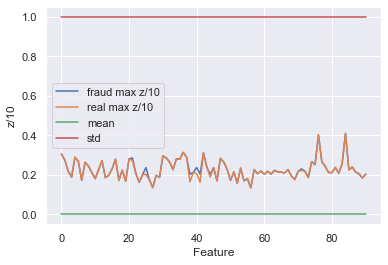

In [126]:
# There are outliers, 2000-8000 stdevs away from mean in several columns
plot_cols = data_cols
plt.plot( data1.loc[ data1.B_PLUS_FLAG==1, plot_cols ].abs().max().values / data1[ plot_cols ].std().values / 10, label='fraud max z/10' )
plt.plot( data1.loc[ data1.B_PLUS_FLAG==0, plot_cols ].abs().max().values / data1[ plot_cols ].std().values / 10, label='real max z/10' )
plt.plot( data1[ plot_cols ].mean().values, label='mean' )
plt.plot( data1[ plot_cols ].std().values, label='std' )
plt.xlabel('Feature')
plt.ylabel('z/10')
plt.legend() ; 

In [127]:
data1.describe()

,ROW,Corp_Residence_Country_Code,BR Code,CUSTOMER_ID,Final_IG,B_PLUS_FLAG,EBITDA_Y0,TOTALASSET_Y0,TOTALASSET_Y2,TOTALASSET_Y3,TOTALDEBT_Y0,TOTALDEBT_Y1,TOTALDEBT_Y3,TOTALREVENUE_Y0,TOTALREVENUE_Y1,TOTALREVENUE_Y2,TOTALREVENUE_Y3,CURRENTASSET_Y2,FIXEDASSET_Y0,FIXEDASSET_Y3,CURRENTLIABILITY_Y3,NONCURRLIA_Y2,TOTALEQUITY_Y0,TOTALEQUITY_Y3,TOTALNETWORTH_Y2,TOTALNETWORTH_Y3,TOTINTEXP_Y1,LEASERENTEXP_Y1,LEASERENTEXP_Y2,LEASERENTEXP_Y3,EBITDAR_Y3,receivabledays_Y2,INVENTORYDAYS_Y0,INVENTORYDAYS_Y3,payableDAYS_Y0,payableDAYS_Y1,payableDAYS_Y3,tangibleNetWorth_Y0,tangibleNetWorth_Y1,tangibleNetWorth_Y2,FIXEDCHARGECOV_Y0,DEBTSERVCOV_Y0,NETPROFIT_Y0,NETPROFIT_Y1,NETPROFIT_Y3,NETSALES_Y2,ASSETTURNOVER_Y2,ASSETTURNOVER_Y3,OPERPROFIT_Y0,OPERPROFIT_Y2,OPERPROFIT_Y3,ARTurnover_Y2,Inventory_Y3,RETAINED_EARNINGS_Y0,RETAINED_EARNINGS_Y1,RETAINED_EARNINGS_Y2,RETAINED_EARNINGS_Y3,FCF_Y0,FCF_Y2,CCE_Y2,CCE_Y3,Year,missing_data_flag,EBITDA_3YearAverage,TOTALASSET_3YearAverage,TOTALDEBT_3YearAverage,TOTALREVENUE_3YearAverage,CURRENTASSET_3YearAverage,FIXEDASSET_3YearAverage,CURRENTLIABILITY_3YearAverage,TOTALEQUITY_3YearAverage,TOTALNETWORTH_3YearAverage,CAPITALIZATION_3YearAverage,EBITDAR_3YearAverage,INVENTORYDAYS_3YearAverage,Capex2Dep_3YearAverage,tangibleNetWorth_3YearAverage,NETPROFIT_3YearAverage,RETAINED_EARNINGS_3YearAverage,FCF_3YearAverage,Total_Leverage_Y0,Total_Leverage_Y1,Total_Leverage_Y3,Ebitda_Margin_Y1,Ebitda_Margin_Y2,Ebitda_Margin_Y3,Interest_CR_Y3,Growth_Y2_to_Y1,Current_Ratio_Y3,Quick_Ratio_Y1,Quick_Ratio_Y3,Debt_Ratio_Y2,Return_Net_Sales_Y2,Average_Total_Assets,Asset_Turnover_Y1,Asset_Turnover_Y2,Asset_Turnover_Y3
count,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,28224.000000,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04,2.822400e+04
mean,20150.780860,0.327664,15.226368,6247.749894,6.698838,0.861926,1.173916e-15,-3.807360e-15,1.782399e-15,1.026138e-15,-4.688112e-15,-7.366242e-16,-8.056040e-18,-5.669438e-16,1.507361e-15,-2.763222e-15,1.897701e-15,-1.353541e-15,-2.364700e-15,-1.757727e-15,-1.953590e-15,6.671408e-16,-1.850623e-15,6.092380e-17,1.288966e-15,4.219351e-16,5.250272e-16,-2.564338e-15,-3.182136e-16,-2.930385e-16,-5.689578e-16,-7.444285e-16,-1.888260e-15,6.042030e-17,-2.157760e-15,-1.627320e-15,-3.348292e-16,2.184949e-15,1.696803e-16,-1.331135e-15,-5.906588e-15,-2.846551e-15,1.830861e-16,1.538704e-15,-1.505472e-15,-1.008012e-15,1.608187e-15,-4.486207e-16,-9.221648e-16,3.141226e-16,-1.011537e-15,3.354837e-15,-7.804289e-17,-2.729361e-15,4.420500e-15,1.550788e-15,8.056040e-18,-4.732924e-17,1.001970e-16,4.834883e-16,-2.326182e-16,2.394658e-15,9.969350e-17,2.565345e-15,-3.595763e-15,3.227451e-16,5.742446e-16,2.369986e-15,-3.866396e-15,-2.527331e-15,2.804005e-15,5.835594e-15,1.598369e-15,-1.220742e-15,3.876969e-17,-1.142195e-15,-2.511219e-16,4.198204e-15,1.271092e-15,2.686186e-16,-1.441024e-15,1.150755e-15,

In [128]:
# Initialize empty lists for results
all_features, all_targets, train_targets, test_targets, X_train, X_test = 0, 0, 0, 0, 0, 0
model_name, train_acc, test_acc, logLoss = [], [], [], []
TN_lst, FN_lst, TP_lst, FP_lst, F1_SCORE, AUC, G_Mean = [], [], [], [], [], [], []
# Get rid of the row column, and the Final IG label. 
all_features = data1.drop(axis=1, labels =["ROW", "Final_IG", "Date"])
all_targets = all_features.pop("B_PLUS_FLAG")
train_features, test_features, train_targets, test_targets = train_test_split(all_features, all_targets, test_size=0.20, stratify=all_targets, random_state=2022)

# Initialize all models in a list
models = [LogisticRegression(),
          DecisionTreeClassifier(max_depth=8),
         ]
# Define all the model names
model_names = ["Logistic Regression",
               "Decision Tree",
              ]
# Print the data size
print("Training Data size: {}".format(train_features.shape))
print("Total Number of class labels in Test Set:\n", test_targets.value_counts())

# Loop over models instead of having separate cell per model
for name, model in zip(model_names, models):
    # Training and model accuracy
    model.random_state = 0
    print("Training Model :  {}".format(name))
    model.fit(train_features, train_targets)
    print("Done Training {}".format(name))
    test_score = model.score(test_features, test_targets) * 100
    train_score = model.score(train_features, train_targets) * 100

    # Predict Y values and see the TP, FP, et c(Using confusion matrix)
    y_pred = model.predict(test_features) # removed the predict.probabilities
    precision, recall, thresholds = metrics.precision_recall_curve(test_targets, y_pred)
    pr_auc = metrics.auc(recall, precision)
    f1score = f1_score(test_targets, y_pred)
    CM = confusion_matrix(test_targets, y_pred)
    TN, FN, TP, FP = CM[0][0], CM[1][0],  CM[1][1], CM[0][1]
    Sensitivity, Specifity = (TP / (TP + FP)) , (TN / (FP + TN))
    Gmean = np.sqrt(Sensitivity * Specifity)
    logloss = log_loss(test_targets, y_pred)

    # Store results
    model_name.append(name)
    train_acc.append(train_score)
    test_acc.append(test_score)
    TN_lst.append(TN)
    FN_lst.append(FN)
    TP_lst.append(TP)
    FP_lst.append(FP)
    F1_SCORE.append(f1score)
    AUC.append(pr_auc)
    G_Mean.append(Gmean)
    logLoss.append(logloss)

results_dict = {"Model Name": model_name, "Train Accuracy": train_acc, "Test Accuracy": test_acc, "TP": TP_lst, "TN": TN_lst, "FN": FN_lst, "FP": FP_lst, "F1-Score": F1_SCORE, "AUC":AUC, "G-Mean": G_Mean, "Log-Loss": logLoss}
results_df = pd.DataFrame.from_dict(results_dict)
results_df

Training Data size: (22579, 94)
Total Number of class labels in Test Set:
 1    4866
0     779
Name: B_PLUS_FLAG, dtype: int64
Training Model :  Logistic Regression
Done Training Logistic Regression
Training Model :  Decision Tree
Done Training Decision Tree


,Model Name,Train Accuracy,Test Accuracy,TP,TN,FN,FP,F1-Score,AUC,G-Mean,Log-Loss
0,Logistic Regression,86.088844,86.076174,4841,18,25,761,0.924914,0.931723,0.141307,4.809227
1,Decision Tree,87.337792,85.810452,4813,31,53,748,0.923180,0.931994,0.185585,4.901002


## Best Pre-Processing Method

In [139]:
def Standardize(data, method):
    """ The following function takes in the given dataset, and standardizes it based on the given method."""
    
    data1 = data.copy()
    non_financial_features = ['ROW','Date','Corp_Residence_Country_Code', 'BR Code', 'CUSTOMER_ID', 'Final_IG', 'B_PLUS_FLAG']
    financial_features = data1.drop(non_financial_features, axis=1)

    if method == "Gaussian":
        for col in data1.columns:
            if col not in financial_features:
                pass
            else:
                data1[col]= std_scaler.fit_transform(data1[col].values.reshape(-1,1))

    if method == "Normalize":
        for col in data1.columns:
          if col in financial_features:
            data1[col]=(data1[col]-data1[col].min())/(data1[col].max()-data1[col].min())
          else:
            pass
        
    if method == "Robust":
        for col in data1.columns:
            if col not in financial_features:
                pass
            else:
                data1[col]= rob_scaler.fit_transform(data1[col].values.reshape(-1,1))

    if method == "Percentile":
        # Center and scale all data, only using the middle 99.8%, so outliers don't pull too much.
        # First generate the percentile data for each feature
        data = financial_features
        data_cols = list(financial_features.columns)
        percentiles =  pd.DataFrame( np.array([ np.percentile( data[i], [ 0.1, 99.0 ] ) for i in data_cols ]).T,
                                    columns=data_cols, index=['min','max'] )

        percentile_means = \
            [ [ np.mean( data.loc[ (data[i]>percentiles[i]['min']) & (data[i]<percentiles[i]['max']) , i ] ) ]
             for i in data_cols ]

        percentiles = percentiles.append( pd.DataFrame(np.array(percentile_means).T, columns=data_cols, index=['mean']) )

        percentile_stds = \
            [ [ np.std( data.loc[ (data[i]>percentiles[i]['min']) & (data[i]<percentiles[i]['max']) , i ] ) ]
             for i in data_cols ]

        percentiles = percentiles.append( pd.DataFrame(np.array(percentile_stds).T, columns=data_cols, index=['stdev']) )

        # STANDARDIZE THE FINANCIAL FEATUES ONLY
        data1[data_cols] = ( data1[data_cols] - percentiles.loc[ 'mean', data_cols ] ) / percentiles.loc[ 'stdev', data_cols ]

    return data1

In [130]:
def run_base_models(data):
    
    # Get rid of the row column, and the Final IG label. 
    all_features = data.drop(axis=1, labels =["ROW", "Final_IG", "Date"])
    all_targets = all_features.pop("B_PLUS_FLAG")
    train_features, test_features, train_targets, test_targets = train_test_split(all_features, all_targets, test_size=0.2)
    
    # Initialize all models in a list
    models = [LogisticRegression(),
              DecisionTreeClassifier(max_depth=8),
             ]
    # Define all the model names
    model_names = ["Logistic Regression",
                   "Decision Tree",
                  ]
    # Print the data size
    print("Training Data size: {}".format(train_features.shape))

    # Loop over models instead of having separate cell per model
    for name, model in zip(model_names, models):
        # Training and model accuracy
        model.random_state = 0
        print("Training Model :  {}".format(name))
        model.fit(train_features, train_targets)
        print("Done Training {}".format(name))
        test_score = model.score(test_features, test_targets) * 100
        train_score = model.score(train_features, train_targets) * 100

        # Predict Y values and see the TP, FP, et c(Using confusion matrix)
        y_pred = model.predict(test_features) # removed the predict.probabilities
        precision, recall, thresholds = metrics.precision_recall_curve(test_targets, y_pred)
        pr_auc = metrics.auc(recall, precision)
        f1score = f1_score(test_targets, y_pred)
        CM = confusion_matrix(test_targets, y_pred)
        TN, FN, TP, FP = CM[0][0], CM[1][0],  CM[1][1], CM[0][1]
        print("{} Train Score : {}".format(name, train_score))
        print("{} Test Score : {}".format(name, test_score))
        print("PR-AUC: {}".format(pr_auc))
        print("F1-Score: {}".format(f1score))
        print("# of False Positives: {}".format(FP))
        print("# of True Positives: {}".format(TP))
        print("# of False Negatives: {}".format(FN))
        print("~"*50)
        print("Model Done")
        print("~"*50)
        
    return None

In [137]:
# Normal Model with NO PREPROCESSING
data1 = df1.copy()
data2 = df2.copy()
print("NO PRE-PROCESSING RESULTS")
run_base_models(data1)

NO PRE-PROCESSING RESULTS
Training Data size: (22579, 94)
Training Model :  Logistic Regression
Done Training Logistic Regression
Logistic Regression Train Score : 86.31028832100624
Logistic Regression Test Score : 85.98759964570417
PR-AUC: 0.9303962278476111
F1-Score: 0.9245445006200514
# of False Positives: 782
# of True Positives: 4846
# of False Negatives: 9
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Model Done
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Training Model :  Decision Tree
Done Training Decision Tree
Decision Tree Train Score : 87.34664954160945
Decision Tree Test Score : 85.96988485385296
PR-AUC: 0.9318826280842021
F1-Score: 0.924006908462867
# of False Positives: 752
# of True Positives: 4815
# of False Negatives: 40
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Model Done
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [140]:
print("STANDARDIZING RESULTS")
data = Standardize(data1, method="Gaussian")
run_base_models(data)

STANDARDIZING RESULTS
Training Data size: (22579, 94)
Training Model :  Logistic Regression
Done Training Logistic Regression
Logistic Regression Train Score : 85.85854112228176
Logistic Regression Test Score : 86.16474756421611
PR-AUC: 0.9331222619442787
F1-Score: 0.9254130455543883
# of False Positives: 741
# of True Positives: 4845
# of False Negatives: 40
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Model Done
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Training Model :  Decision Tree
Done Training Decision Tree
Decision Tree Train Score : 87.2979317064529
Decision Tree Test Score : 86.28875110717449
PR-AUC: 0.9342441243119791
F1-Score: 0.9258762689140012
# of False Positives: 723
# of True Positives: 4834
# of False Negatives: 51
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Model Done
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [141]:
print("NORMALIZATION RESULTS")
data = Standardize(data1, method="Normalize")
run_base_models(data)

NORMALIZATION RESULTS
Training Data size: (22579, 94)
Training Model :  Logistic Regression
Done Training Logistic Regression
Logistic Regression Train Score : 86.22613933300855
Logistic Regression Test Score : 86.12931798051373
PR-AUC: 0.9306465899025687
F1-Score: 0.9254782525935091
# of False Positives: 783
# of True Positives: 4862
# of False Negatives: 0
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Model Done
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Training Model :  Decision Tree
Done Training Decision Tree
Decision Tree Train Score : 87.19163824792949
Decision Tree Test Score : 85.98759964570417
PR-AUC: 0.931897383781893
F1-Score: 0.924240973086869
# of False Positives: 754
# of True Positives: 4825
# of False Negatives: 37
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Model Done
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [142]:
print("ROBUST RESULTS")
data = Standardize(data1, method="Robust")
run_base_models(data)

ROBUST RESULTS
Training Data size: (22579, 94)
Training Model :  Logistic Regression
Done Training Logistic Regression
Logistic Regression Train Score : 86.26157048584969
Logistic Regression Test Score : 86.11160318866253
PR-AUC: 0.9308948257707996
F1-Score: 0.9251908396946565
# of False Positives: 776
# of True Positives: 4848
# of False Negatives: 8
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Model Done
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Training Model :  Decision Tree
Done Training Decision Tree
Decision Tree Train Score : 87.22706940077063
Decision Tree Test Score : 86.00531443755536
PR-AUC: 0.9315410457845941
F1-Score: 0.9243439954031794
# of False Positives: 760
# of True Positives: 4826
# of False Negatives: 30
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Model Done
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


Robust Scaler seems to be working the best. <br> 
Hence, we reccomend Robust Scaler.

# Dimensionality Reduction with Principal Component Analysis 

# Solving Class Imbalance Issue<a class="anchor" id="4.3"></a>


['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


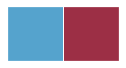

In [144]:
pal = sns.color_palette('tab10')
print(pal.as_hex())
#sns.set_palette('icefire')
sns.set_palette(['#55a3cd', '#9c2f45'])
sns.palplot(sns.color_palette())

In [151]:
data1.shape

(28224, 98)

In [152]:
data1 = df1.copy()
data2 = df2.copy()

In [153]:
data1.head()

,ROW,Corp_Residence_Country_Code,BR Code,CUSTOMER_ID,Final_IG,B_PLUS_FLAG,EBITDA_Y0,TOTALASSET_Y0,TOTALASSET_Y2,TOTALASSET_Y3,TOTALDEBT_Y0,TOTALDEBT_Y1,TOTALDEBT_Y3,TOTALREVENUE_Y0,TOTALREVENUE_Y1,TOTALREVENUE_Y2,TOTALREVENUE_Y3,CURRENTASSET_Y2,FIXEDASSET_Y0,FIXEDASSET_Y3,CURRENTLIABILITY_Y3,NONCURRLIA_Y2,TOTALEQUITY_Y0,TOTALEQUITY_Y3,TOTALNETWORTH_Y2,TOTALNETWORTH_Y3,TOTINTEXP_Y1,LEASERENTEXP_Y1,LEASERENTEXP_Y2,LEASERENTEXP_Y3,EBITDAR_Y3,receivabledays_Y2,INVENTORYDAYS_Y0,INVENTORYDAYS_Y3,payableDAYS_Y0,payableDAYS_Y1,payableDAYS_Y3,tangibleNetWorth_Y0,tangibleNetWorth_Y1,tangibleNetWorth_Y2,FIXEDCHARGECOV_Y0,DEBTSERVCOV_Y0,NETPROFIT_Y0,NETPROFIT_Y1,NETPROFIT_Y3,NETSALES_Y2,ASSETTURNOVER_Y2,ASSETTURNOVER_Y3,OPERPROFIT_Y0,OPERPROFIT_Y2,OPERPROFIT_Y3,ARTurnover_Y2,Inventory_Y3,RETAINED_EARNINGS_Y0,RETAINED_EARNINGS_Y1,RETAINED_EARNINGS_Y2,RETAINED_EARNINGS_Y3,FCF_Y0,FCF_Y2,CCE_Y2,CCE_Y3,Date,Year,missing_data_flag,EBITDA_3YearAverage,TOTALASSET_3YearAverage,TOTALDEBT_3YearAverage,TOTALREVENUE_3YearAverage,CURRENTASSET_3YearAverage,FIXEDASSET_3YearAverage,CURRENTLIABILITY_3YearAverage,TOTALEQUITY_3YearAverage,TOTALNETWORTH_3YearAverage,CAPITALIZATION_3YearAverage,EBITDAR_3YearAverage,INVENTORYDAYS_3YearAverage,Capex2Dep_3YearAverage,tangibleNetWorth_3YearAverage,NETPROFIT_3YearAverage,RETAINED_EARNINGS_3YearAverage,FCF_3YearAverage,Total_Leverage_Y0,Total_Leverage_Y1,Total_Leverage_Y3,Ebitda_Margin_Y1,Ebitda_Margin_Y2,Ebitda_Margin_Y3,Interest_CR_Y3,Growth_Y2_to_Y1,Current_Ratio_Y3,Quick_Ratio_Y1,Quick_Ratio_Y3,Debt_Ratio_Y2,Return_Net_Sales_Y2,Average_Total_Assets,Asset_Turnover_Y1,Asset_Turnover_Y2,Asset_Turnover_Y3
0,5662,1,5,1576,5,1,575863.911214,619611.510181,611355.907673,582433.004400,623105.791017,596800.177680,598408.339905,611355.411490,589592.109008,605336.777910,574789.603998,614991.732391,609095.636450,580405.105567,583030.371565,600103.052065,596259.219747,601814.939331,596653.190112,590035.602606,604922.163814,576650.299516,620686.247107,610847.649882,618110.180319,590842.797526,590472.808115,574363.146314,582917.058057,583420.366083,583658.695782,590316.935078,602489.197881,607756.994574,579949.325730,573565.511062,623675.986993,618944.803911,590502.807033,595156.410271,608524.711934,622059.106399,575870.723892,570519.450943,608807.689045,621562.468837,588954.395020,604537.606945,597031.247138,600893.706501,590802.111805,606861.990009,587502.761835,603242.309649,622846.821734,2017-10-01,2017,1,586584.943568,618271.670268,609304.862614,602763.503201,619553.452999,601863.209979,576880.644499,583218.942030,579945.197593,593531.196346,592446.376722,595352.641112,599825.044022,598249.924789,612469.435351,601225.731355,590447.163586,1.082037,0.989983,0.973650,1.022467,0.964168,1.056249,1.002464,-0.026010,1.036787,2.028418,2.078371,0.982178,0.980661,615305.200681,0.974311,0.967254,0.954216
1,16369,1,5,4545,7,1,599469.364624,608126.531748,587550.520995,508218.086643,627335.355343,611300.879046,0.000000,604626.757034,586282.226249,624691.726730,501716.330148,620321.870767,577715.935070,505654.999259,511127.253255,617623.837767,599915.942888,0.000000,582300.999226,484085.796269,601973.826113,571906.704700,577600.492683,511973.808386,511385.032364,571806.694543,623527.400755,0.000000,625385.094320,627447.879790,0.000000,584262.286957,617559.499371,627464.217041,622519.607329,585261.894944,584319.594719,582119.776636,512159.166941,577905.225922,625997.193308,511309.169231,599331.009039,579472.873802,512615.646688,581883.305291,0.000000,603346.339606,621227.589036,594596.565749,0.000000,519458.368851,0.000000,589034.257388,0.000000,2015-10-01,2015,2,607711.848590,601323.625703,609814.288424,602970.795594,606140.877563,578330.764924,608768.294754,594814.472686,589344.521979,590552.129934,598740.974758,617741.404544,594804.718168,604961.786669,588079.089621,607362.361892,245446.846183,1.046484,0.993383,0.000000,1.049619,0.980812,1.000000,1.000000,-0.061486,0.755764,2.051120,0.000000,0.974456,1.060217,456606.158088,1.197810,1.1

In [167]:
data_1 = df1.iloc[:, : 20]
data_2 = df1.iloc[:, 20:40]
data_3 = df1.iloc[:, 40:60]
data_4 = df1.iloc[:, 60:80]
data_5 = df1.iloc[:, 80:]

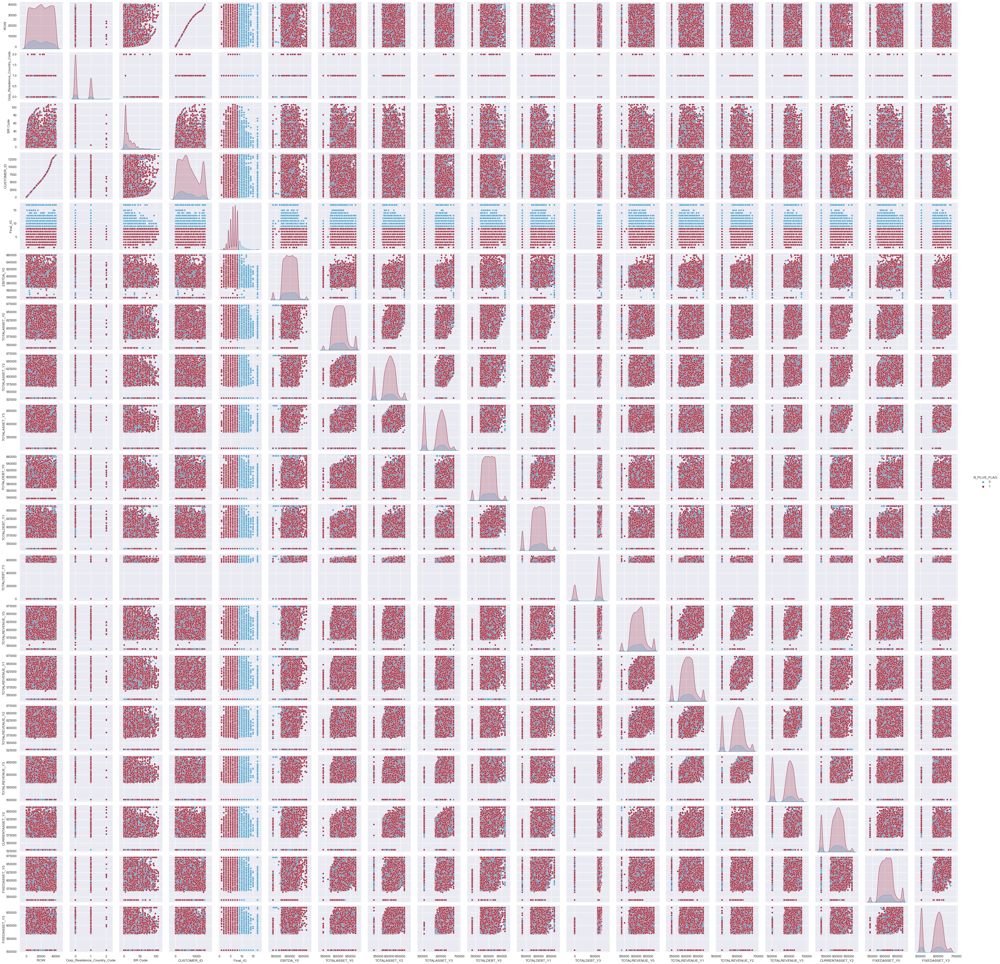

In [163]:
sns.pairplot(data_1, hue="B_PLUS_FLAG")

In [168]:
data_2["B_PLUS_FLAG"] = data1["B_PLUS_FLAG"]
data_3["B_PLUS_FLAG"] = data1["B_PLUS_FLAG"]
data_4["B_PLUS_FLAG"] = data1["B_PLUS_FLAG"]
data_5["B_PLUS_FLAG"] = data1["B_PLUS_FLAG"]

In [ ]:
sns.pairplot(data_2, hue="B_PLUS_FLAG")

In [ ]:
sns.pairplot(data_3, hue="B_PLUS_FLAG")

In [ ]:
sns.pairplot(data_4, hue="B_PLUS_FLAG")

In [ ]:
sns.pairplot(data_5, hue="B_PLUS_FLAG")

<AxesSubplot:title={'center':'EBITDA Margin of Current Year & Last Year with Original Dataset'}, xlabel='EBITDA_Y0', ylabel='TOTALASSET_Y0'>

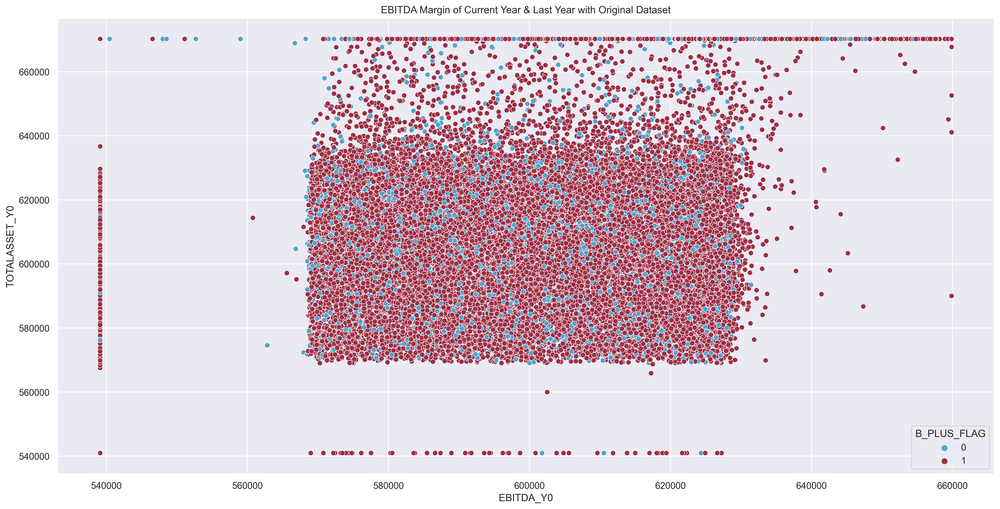

In [160]:
plt.figure(figsize=(20,10), dpi =300)
plt.title("EBITDA Margin of Current Year & Last Year with Original Dataset")
sns.scatterplot(x="EBITDA_Y0", y='TOTALASSET_Y0', hue = 'B_PLUS_FLAG', data=df1)

As we can see, there are only a few blue examples compared to the red ones 

## SMOTE - Synthetic Minority Oversampling Technique

SMOTE is an oversampling technique where the synthetic samples are generated for the minority class. This algorithm helps to overcome the overfitting problem posed by random oversampling. It focuses on the feature space to generate new instances with the help of interpolation between the positive instances that lie together.

Working Procedure:
At first the total no. of oversampling observations, N is set up. Generally, it is selected such that the binary class distribution is 1:1. But that could be tuned down based on need. Then the iteration starts by first selecting a positive class instance at random. Next, the KNN’s (by default 5) for that instance is obtained. At last, N of these K instances is chosen to interpolate new synthetic instances. To do that, using any distance metric the difference in distance between the feature vector and its neighbors is calculated. Now, this difference is multiplied by any random value in (0,1] and is added to the previous feature vector. This is pictorially represented below:

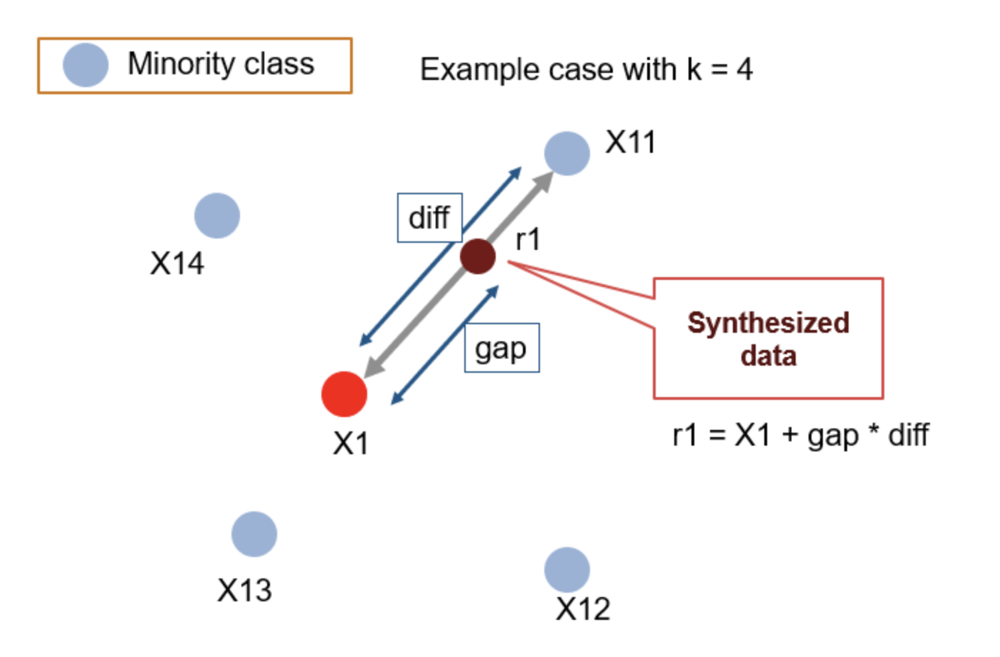

In [ ]:
data1 = df1.copy(deep=True)

In [ ]:
# Get rid of the row column, and the Final IG label. 

all_features = df1.drop(axis=1, labels =["ROW", "Final_IG", "Period", "Date"])
all_targets = all_features.pop("B_PLUS_FLAG")

# Generate Synthetic Data using SMOTE
smote = SMOTE(random_state=123)

# fit predictor and target variable
x_smote, y_smote = smote.fit_resample(all_features, all_targets)
# Added approx. 10k more training examples! (for fruadulent rows)
print('Original target variable shape', Counter(all_targets))
print('Resample target variable shape', Counter(y_smote))

df_sm = df_sm = x_smote.copy()
df_sm['Y'] = y_smote

## ADASYN: Adaptive Synthetic Sampling Approach

In [ ]:
# Get rid of the row column, and the Final IG label. 
all_features = df1.drop(axis=1, labels =["ROW", "Final_IG", "Period"])
all_targets = all_features.pop("B_PLUS_FLAG")

print('Original target variable shape', Counter(all_targets))
# oversampling the train dataset using ADASYN
ada = ADASYN(random_state=123)
X_train_ada, y_train_ada = ada.fit_resample(all_features, all_targets)

counter = Counter(y_train_ada)
print('Resample target variable shape', Counter(y_train_ada))

df_ada = X_train_ada.copy()
df_ada['Y'] = y_train_ada

## SMOTE + TOMEK Links

(Oversampling & then adding Tomek links  --> Removes samples near/overlaping the boundaries)

In [ ]:
# Get rid of the row column, and the Final IG label. 
all_features = df1.drop(axis=1, labels =["ROW", "Final_IG", "Period"])
all_targets = all_features.pop("B_PLUS_FLAG")

counter = Counter(all_targets)
print('Original target variable shape',counter)
# oversampling the train dataset using SMOTE + Tomek
smtom = SMOTETomek(random_state=123)
X_train_smtom, y_train_smtom = smtom.fit_resample(all_features, all_targets)

counter = Counter(y_train_smtom)
print('Resample target variable shape',counter)

df_smtom = X_train_smtom.copy()
df_smtom['Y'] = y_train_smtom

## SMOTE + ENN

In [ ]:
# Get rid of the row column, and the Final IG label. 
all_features = df1.drop(axis=1, labels =["ROW", "Final_IG", "Period"])
all_targets = all_features.pop("B_PLUS_FLAG")

counter = Counter(all_targets)
print('Original target variable shape',counter)
# oversampling the train dataset using SMOTE + ENN
smenn = SMOTEENN()
X_train_smenn, y_train_smenn = smenn.fit_resample(all_features, all_targets)

counter = Counter(y_train_smenn)
print('Resample target variable shape',counter)

df_smenn = X_train_smenn.copy()
df_smenn['Y'] = y_train_smenn

## Visualization

In [ ]:
f, axes = plt.subplots(2,2,figsize=(15, 10), dpi=300)
sns.despine()
sns.scatterplot(x="Ebitda_Margin_Y0", y='Ebitda_Margin_Y1', hue = 'Y', data=df_sm, ax=axes[0,0])
axes[0,0].set_title('Resampling with SMOTE', fontsize=14)
sns.scatterplot(x="Ebitda_Margin_Y0", y='Ebitda_Margin_Y1', hue = 'Y', data=df_ada, ax=axes[0,1])
axes[0,1].set_title('Resampling with ADASYN', fontsize=14)
sns.scatterplot(x="Ebitda_Margin_Y0", y='Ebitda_Margin_Y1', hue = 'Y', data=df_smtom, ax=axes[1,0])
axes[1,0].set_title('Resampling with SMOTE + Tomek Links', fontsize=14)
sns.scatterplot(x="Ebitda_Margin_Y0", y='Ebitda_Margin_Y1', hue = 'Y', data=df_smenn, ax=axes[1,1])
axes[1,1].set_title('Resampling with SMOTE + ENN', fontsize=14)
plt.setp(axes, yticks=[])
plt.tight_layout()
plt.show()

## Finding out the BEST imbalance technique

In [ ]:
def resample_df(x_train, y_train, method, num_nieghbours):

  if method == "SMOTE":
    # Generate Synthetic Data using SMOTE
    smote = SMOTE(random_state=123, k_neighbors = num_nieghbours)
    X, y = smote.fit_resample(x_train, y_train)
  
  if method == "ADASNYA":
    # Generate synthetic data using ADASNYA
    ada = ADASYN(random_state=123, n_neighbors=num_nieghbours)
    X, y = ada.fit_resample(x_train, y_train)
    
  if method == "SMOTE_TOMEK":
    # Generate synthetic data using SMOTE + Tomek Links
    smtom = SMOTETomek(random_state=123)
    X, y = smtom.fit_resample(x_train, y_train)

  if method == "SMOTE_ENN":
    # Generate synthetic data using SMOTE & ENN 
    smenn = SMOTEENN()
    X, Y = smenn.fit_resample(x_train, y_train)
    
  else: 
    X,y = x_train, y_train

  return X,y

In [ ]:
# Modify our run_base_models() function to also take into account re-sampling
def synthetic_data_base_models(data, re_sampling_method, num_of_nieghbours=5):
  """
  Data needs to be FULL data (Including all of our variables)
  Resampleing methods can be: "SMOTE", "ADASNYA", "SMOTE_TOMEK", "SMOTE_ENN"
  num_of_nieghbours: How many nieghbours to look at when creating synthetic data (only SMOTE & ADASYN use this)
  """
  
  # Get rid of the row column, and the Final IG label. 
  all_features = data.drop(axis=1, labels =["ROW", "Final_IG", "Date"])
  all_targets = all_features.pop("B_PLUS_FLAG")
  train_features , test_features, train_targets, test_targets = train_test_split(all_features, all_targets, test_size=0.2)
  
  # Re-Sample data based on method provided
  # We only re-sample the training section & don't touch the test section. 
  train_features, train_targets = resample_df(train_features, train_targets, method=re_sampling_method, num_nieghbours=num_of_nieghbours)

  # Initialize all models in a list
  models = [LogisticRegression(),
            DecisionTreeClassifier(max_depth=8),
            ]
  # Define all the model names
  model_names = ["Logistic Regression",
                 "Decision Tree",
                ]
  # Print the data size
  print("Training Data size: {}".format(train_features.shape))

  # Loop over models instead of having separate cell per model
  for name, model in zip(model_names, models):
      # Training and model accuracy
      model.random_state = 0
      print("Training Model :  {}".format(name))
      model.fit(train_features, train_targets)
      print("Done Training {}".format(name))
      test_score = model.score(test_features, test_targets) * 100
      train_score = model.score(train_features, train_targets) * 100

      # Predict Y values and see the TP, FP, et c(Using confusion matrix)
      y_pred = model.predict(test_features) # removed the predict.probabilities
      precision, recall, thresholds = metrics.precision_recall_curve(test_targets, y_pred)
      pr_auc = metrics.auc(recall, precision)
      f1score = f1_score(test_targets, y_pred)
      CM = confusion_matrix(test_targets, y_pred)
      TN, FN, TP, FP = CM[0][0], CM[1][0],  CM[1][1], CM[0][1]
      print("{} Train Score : {}".format(name, train_score))
      print("{} Test Score : {}".format(name, test_score))
      print("PR-AUC: {}".format(pr_auc))
      print("F1-Score: {}".format(f1score))
      print("# of False Positives: {}".format(FP))
      print("# of True Positives: {}".format(TP))
      print("# of False Negatives: {}".format(FN))
      print("~"*50)
      print("Model Done")
      print("~"*50)
      
  return None

In [ ]:
data = df1.copy(deep=True)
data = Standardize(data, method="Normalization")
print("ORIGINAL DATASET RESULTS")
synthetic_data_base_models(data, re_sampling_method="", num_of_nieghbours=0)

In [ ]:
data = df1.copy(deep=True)
data = Standardize(data, method="Normalization")
print("SMOTE DATASET RESULTS")
synthetic_data_base_models(data, re_sampling_method="SMOTE", num_of_nieghbours=5)

In [ ]:
data = df1.copy(deep=True)
data = Standardize(data, method="Normalization")
print("ADASNYA DATASET RESULTS")
synthetic_data_base_models(data, re_sampling_method="ADASNYA", num_of_nieghbours=5)

In [ ]:
# Get rid of the row column, and the Final IG label. 

data = Standardize(df1, method="Normalize")
all_features = data.drop(axis=1, labels =["ROW", "Final_IG", "Date"])
all_targets = all_features.pop("B_PLUS_FLAG")
train_features , test_features, train_targets, test_targets = train_test_split(all_features, all_targets, test_size=0.2)

# Generate Synthetic Data using SMOTE
ada = ADASYN(random_state=130, n_neighbors=5)
X_train_ada, y_train_ada = ada.fit_resample(all_features, all_targets)
train_features, train_targets = X_train_ada, y_train_ada

# Initialize all models in a list
models = [LogisticRegression(),
          DecisionTreeClassifier(max_depth=8),
          RandomForestClassifier(max_depth=12, n_estimators=100),
         ]
# Define all the model names
model_names = ["Logistic Regression",
               "Decision Tree",
               "Random Forest",
              ]
# Print the data size
print("ADASNYA DATASET RESULTS")
print("Training Data size: {}".format(train_features.shape))

# Loop over models instead of having separate cell per model
for name, model in zip(model_names, models):
    # Training and model accuracy
    model.random_state = 0
    print("Training Model :  {}".format(name))
    model.fit(train_features, train_targets)
    print("Done Training {}".format(name))
    test_score = model.score(test_features, test_targets) * 100
    train_score = model.score(train_features, train_targets) * 100
    
    # Predict Y values and see the TP, FP, et c(Using confusion matrix)
    y_pred = model.predict(test_features) # removed the predict.probabilities
    precision, recall, thresholds = metrics.precision_recall_curve(test_targets, y_pred)
    pr_auc = metrics.auc(recall, precision)
    f1score = f1_score(test_targets, y_pred)
    CM = confusion_matrix(test_targets, y_pred)
    TN, FN, TP, FP = CM[0][0], CM[1][0],  CM[1][1], CM[0][1]
    print("{} Train Score : {}".format(name, train_score))
    print("{} Test Score : {}".format(name, test_score))
    print("PR-AUC: {}".format(pr_auc))
    print("F1-Score: {}".format(f1score))
    print("# of False Positives: {}".format(FP))
    print("# of True Positives: {}".format(TP))
    print("# of False Negatives: {}".format(FN))
    print("~"*50)
    print("Model Done")
    print("~"*50)

print("*"*50)    
print("~"*50)
print("ALL MODELS DONE")
print("~"*50)
print("*"*50)

**Neural Network**
The following code uses the Keras Sequential model to generate a neural network with 4 dense layers. The final layer uses a sigmoid activation to squeeze values between 0 and 1.

In [ ]:
#Packages/Methods needed for a Neural Network Model
from numpy import loadtxt
from keras.models import Sequential
from keras.layers import Dense, Flatten
import tensorflow as tf
import random as python_random

In [ ]:
def set_seed():
  """ For a Keras model, a seed must be set to generate random number in a well-defined initial state. 
  This function will set the initial seed for numpy, python, and TensorFlow backend operations to a set value.

  Numpy: Set the seed for Numpy, default = 0
  Python: Set the seed for PYTHONHASHSEED, default = 0
  TensorFlow: Set the seed for TensorFlow backend operations, default = 0
  
  For more details, visit Keras documentation:
  https://keras.io/getting_started/faq/#how-can-i-obtain-reproducible-results-using-keras-during-development
  """
  np.random.seed(0)
  python_random.seed(0)
  tf.random.set_seed(0)
  return

In [ ]:
#Set the seed to obtain reproducible results
set_seed()

# create scaler
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1,1))

#Collect the data
dataset_NN = data
dataset_NN = dataset_NN.fillna(dataset_NN.median())
# dataset_NN = dataset_NN.drop(KMeans_outliers, axis=0)

print(dataset_NN['Final_IG'].value_counts(ascending=True))

#Preprocess for the Neural Network
features_to_drop = ["ROW",'Date','Year','Month']
dataset_NN.drop(features_to_drop,axis=1,inplace=True)

x_NN = dataset_NN.drop(axis=1, labels =["B_PLUS_FLAG"])
y_NN = x_NN.pop("Final_IG")

standardized_x_NN = scaler.fit_transform(x_NN)
#Split the data into training and test sets
split = 0.8
split_value = math.ceil(len(x_NN)*split)
x_NN_train, x_NN_test = standardized_x_NN[split_value:], standardized_x_NN[:split_value]
y_NN_train, y_NN_test = y_NN[split_value:], y_NN[:split_value]

print(y_NN_train)
ada = ADASYN(random_state=123,n_neighbors=2,sampling_strategy='minority')
x_NN_train, y_NN_train = ada.fit_resample(x_NN_train, y_NN_train)

x_array_train, x_array_test = np.asarray(x_NN_train).astype('float32'), np.asarray(x_NN_test).astype('float32')
y_array_train, y_array_test = np.asarray(y_NN_train).astype('float32'), np.asarray(y_NN_test).astype('float32')

# define the keras model
model = Sequential()
model.add(Dense(30, input_dim=len(x_NN.columns), activation='relu'))
model.add(Dense(18, activation='sigmoid'))
# model.add(Flatten())

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)

# compile the keras model
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
##In Keras, the multi-class log loss is defined as the cross entropy. A sparse categorical cross entropy is used as it places a constraint that the final outcome is an integer.

# fit the keras model on the dataset
model.fit(x_array_train, y_array_train, epochs=150, batch_size=10, callbacks=[callback])
# # evaluate the keras model
_, accuracy = model.evaluate(x_NN_test, y_NN_test)
print('Accuracy: %.2f' % (accuracy*100))

# Task 1 FINAL Submission



Please see at the bottom of the following notebook: https://colab.research.google.com/drive/12-WoDlpAyI1EFaKZ8MMYqq6VqO2LqkxE#scrollTo=s6jNF47uJWPg

# TASK 2 FINAL SUBMISSION 

Please see at the bottom of the following notebook: https://colab.research.google.com/drive/1tBv1SWpnbOqn82i2G-w3US-VB81pm5KF#scrollTo=vh2wX7k-NtG9
